## Neural Style Transfer (NST)

### Table Of Contents:
* [1. Import libraries](#import-libraries)
* [2. Load Images](#load-image)
* [3. Neural Style Transfer Algorithm (NST)](#nst)
    * [3.1 Content Cost Function](#content-cost)
    * [3.2 Style Cost Function](#style-cost)
    * [3.3 Total Cost Function](#total-cost)
* [4. Reshape and Normalize the image](#reshape)
* [5. Transfer Learning via VGG-19](#transfer-learning)
* [6. Compute Total Cost](#total-cost)
    * [6.1 Compute Content Image Encoding](#content-image-encoding)
    * [6.2 Compute Style Image Encoding](#style-image-encoding)
* [7. Train the model](#train-model)

### 1. Import libraries <a class="anchor" id="import-libraries"></a>

In [25]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf

Load VGG19 Model from Keras

In [26]:
tf.random.set_seed(272)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False, input_shape=(img_size, img_size, 3), weights='./models/vgg19_weights.h5')
vgg.trainable = False

### 2. Load Images <a class="anchor" id="load-image"></a>

We will apply the neural style transfer algorithm to generate an output image with the style of [The Starry Night](https://en.wikipedia.org/wiki/The_Starry_Night)

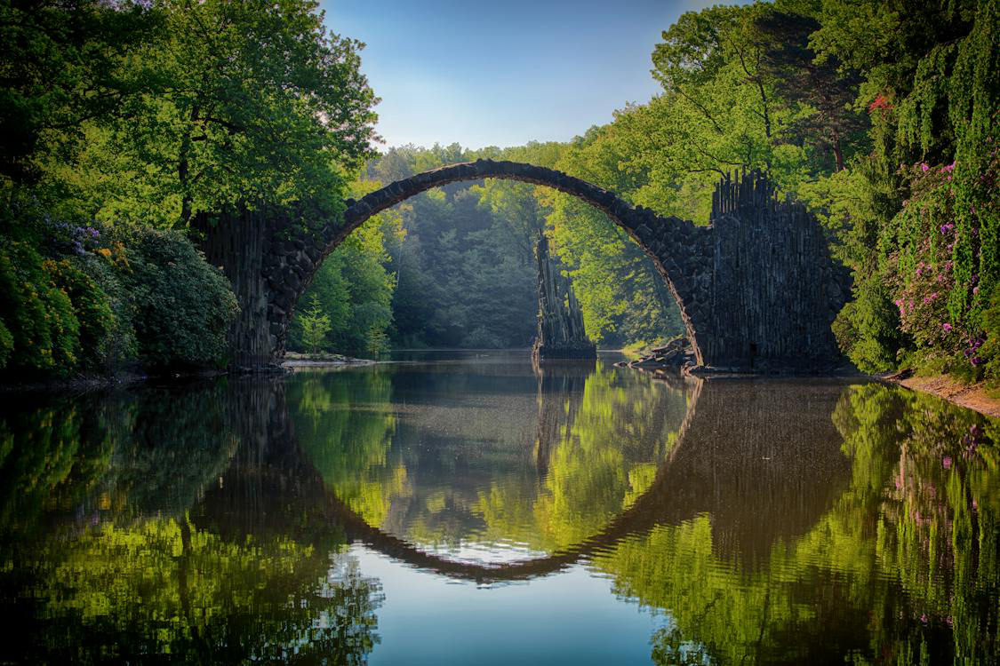

In [3]:
content_image = Image.open("./img/bridge.jpg")
content_image

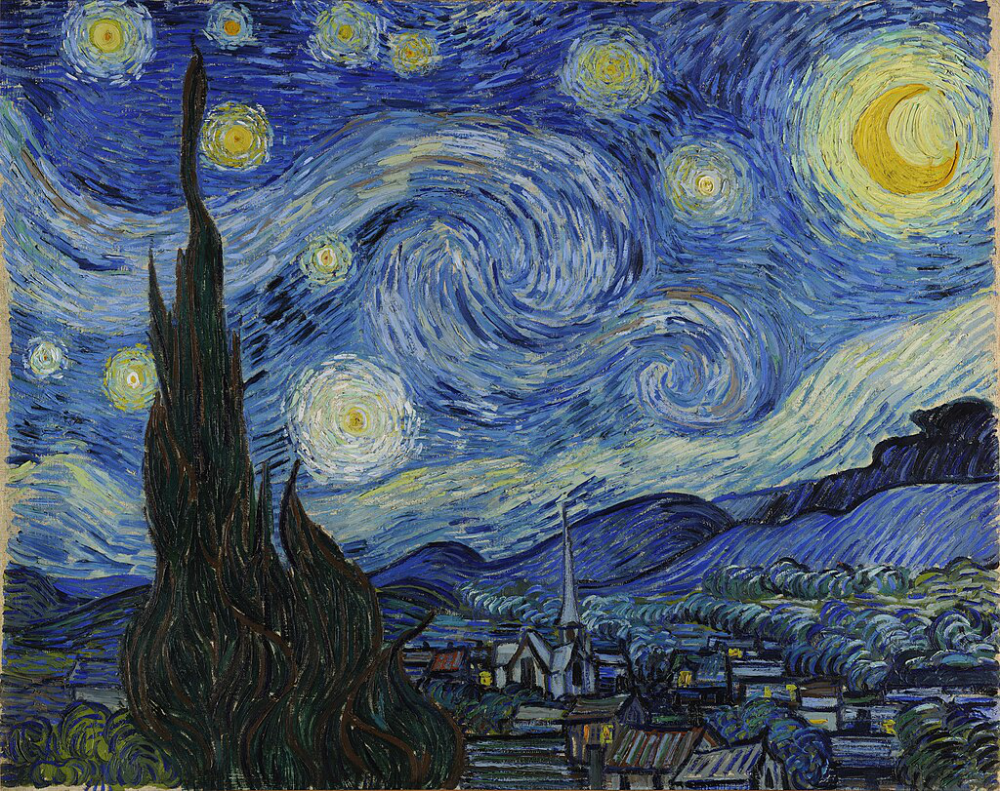

In [4]:
style_image = Image.open("./img/starry_night.jpg")
style_image

### 3. Neural-Style-Transfer (NST) Algorithm <a class="anchor" id="nst"></a>

For more information on the NST algorithm, please refer to this [paper](https://arxiv.org/abs/1508.06576) by Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, (2015)

First we compute the content cost function so that the generated image G match the content of image C.

#### 3.1 Content Cost Function <a class="anchor" id="content-cost"></a>

The content cost function is defined as:

$$J_{content}(C, G) = \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{\text{all entries}} (a^{(C)} - a^{(G)})^2 $$

In [5]:
def compute_content_cost(content_output, generated_output):
    """
    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- Content Cost function Equation.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    a_C_unrolled = tf.reshape(a_C, shape=[_, n_H * n_W, n_C])
    a_G_unrolled = tf.reshape(a_G, shape=[_, n_H * n_W, n_C])
    
    J_content = (1/(4*n_H*n_W*n_C))*tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))
    
    return J_content

#### 3.2 Style Cost Function <a class="anchor" id="style-cost"></a>

Before computing the style cost function, we will need to calculate the gram matrix, also known as style matrix, which measures the style of an image. The output produce the correlation between filters. The gram matrix is defined as:
$$\mathbf{G}_{gram} = \mathbf{A}_{unrolled} \mathbf{A}_{unrolled}^T$$

In [6]:
def gram_matrix(A):
    """
    Argument:
    A -- matric of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    GA = tf.linalg.matmul(A, tf.transpose(A))
    return GA

To minimize the distance between the Gram matrix of the style image (S) and the Gram matrix of the generated image (G), we compute the style cost function. 

The style cost function is defined as:

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2 $$

In [7]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    a_S = tf.transpose(tf.reshape(a_S, shape=[n_H * n_W, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape=[n_H * n_W, n_C]))

    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    J_style_layer = ((.5 / (n_H * n_W * n_C)) ** 2) * tf.reduce_sum(tf.square(tf.subtract(GS, GG)))
    
    return J_style_layer

#### Apply Style Weights

Each layer will be given weights ( 𝜆[𝑙] ) that reflect how much each layer will contribute to the style.

In [8]:
for layer in vgg.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Layers below are choosen to represent the style of the image and style cost are assigned to each of them

In [9]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)
]

Combine the style costs for the different layers as follows:

$$J_{style}(S,G) = \sum _{l} \lambda^{[l]} J^{[l]}_{style}(S, G) $$

In [10]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    J_style = 0
    a_S = style_image_output[:-1]

    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):  
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])
        J_style += weight[1] * J_style_layer

    return J_style

#### 3.3 Total Cost Function <a class="anchor" id="style-cost"></a>

Total cost function minimizes both the style and content cost, the formula is defined as:
    
$$ J(G) = \alpha J_{content}(C, G) + \beta J_{style}(C, G) $$    

In [11]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """
    J = alpha*J_content + beta*J_style
    return J

### 4. Reshape and Normalize the image <a class="anchor" id="reshape"></a>

(1, 400, 400, 3)


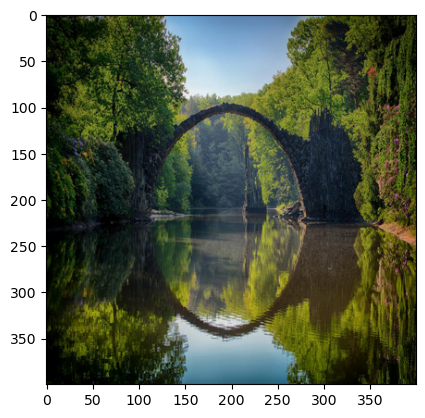

In [12]:
## 1. Load the content image
content_image = np.array(Image.open("./img/bridge.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 400, 400, 3)


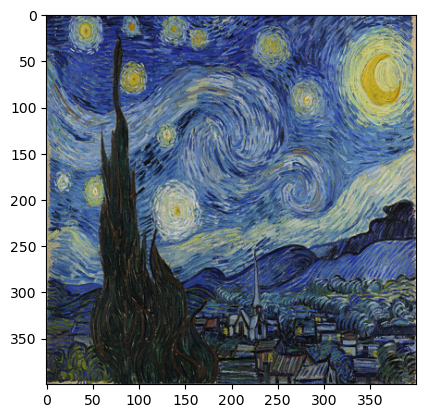

In [13]:
## 2. Load the style image
style_image =  np.array(Image.open("./img/starry_night.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


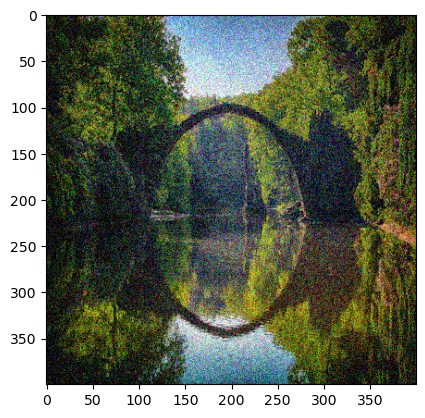

In [14]:
## 3. Randomly Initialize the Image to be Generated
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

### 5. Transfer Learning via VGG-19 <a class="anchor" id="transfer-learning"></a>

Load Pre-trained VGG19 Model

In [15]:
def get_layer_outputs(vgg, layer_names):
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]
    
    model = tf.keras.Model([vgg.input], outputs)
    return model

Define the content layer and build the model

In [16]:
content_layer = [('block5_conv4', 1)]
vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Save the outputs for the content and style layers in separate variables.

In [17]:
content_target = vgg_model_outputs(content_image)
style_targets = vgg_model_outputs(style_image)

### 6. Compute Total Cost <a class="anchor" id="total-cost"></a>

#### 6.1 Compute Content Image Encoding <a class="anchor" id="content-image-encoding"></a>

In [18]:
# Assign the content image to be the input of the VGG model.  
# Set a_C to be the hidden layer activation from the layer we have selected
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

#### 6.2 Compute Style Image Encoding <a class="anchor" id="style-image-encoding"></a>

In [19]:
# Assign the input of the model to be the "style" image 
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [20]:
def clip_0_1(image):
    """
    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

### 7. Train The Model <a class="anchor" id="train-model"></a>

In [21]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        a_G = vgg_model_outputs(generated_image)
        
        J_style = compute_style_cost(a_S, a_G, STYLE_LAYERS=STYLE_LAYERS)
        J_content = compute_content_cost(a_C, a_G)
        J = total_cost(J_content, J_style, alpha = 10, beta = 40)
        
    grad = tape.gradient(J, generated_image)
    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    return J

In [22]:
generated_image = tf.Variable(generated_image)

Train the model with 5000 epochs

Epoch 0 


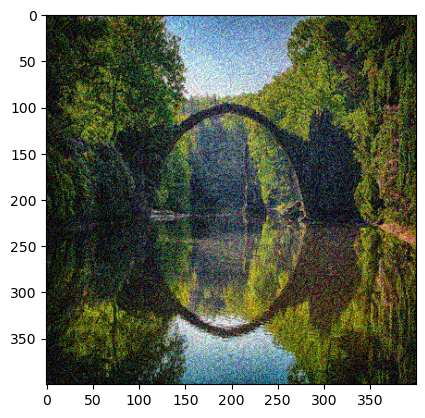

Epoch 250 


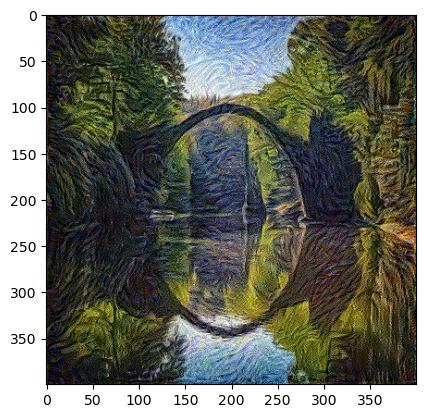

Epoch 500 


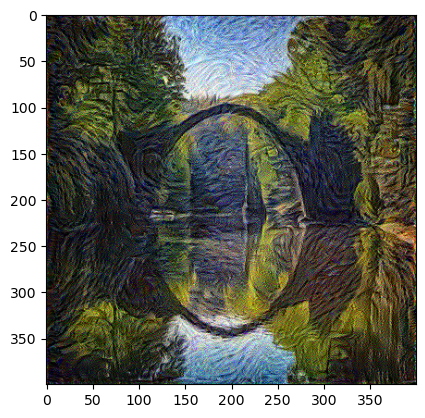

Epoch 750 


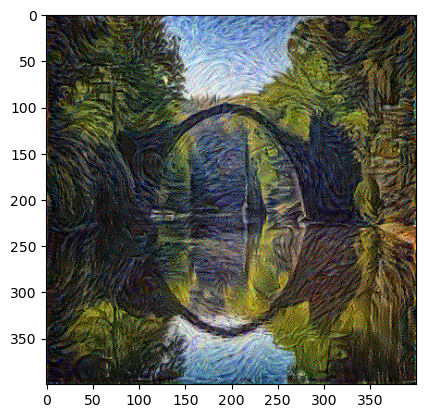

Epoch 1000 


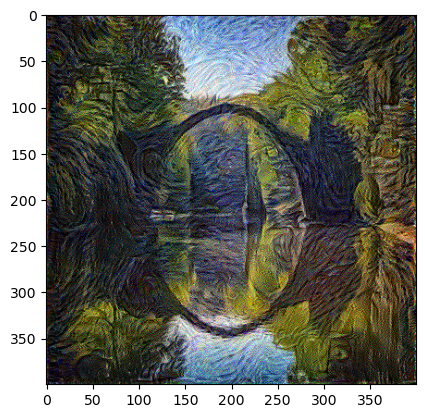

Epoch 1250 


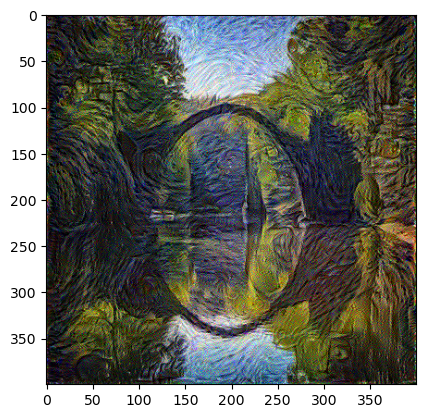

Epoch 1500 


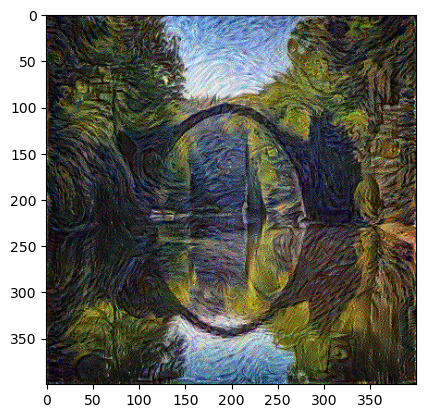

Epoch 1750 


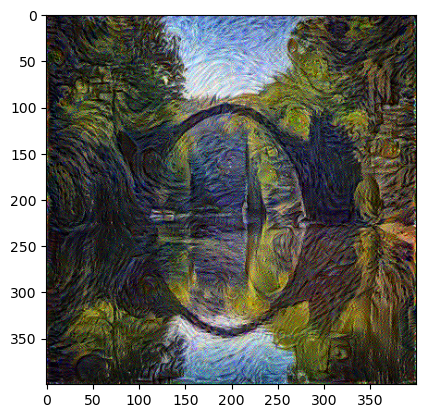

Epoch 2000 


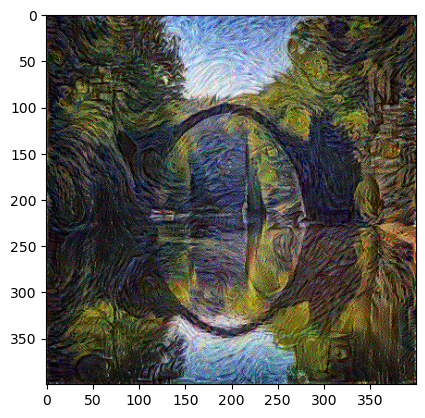

Epoch 2250 


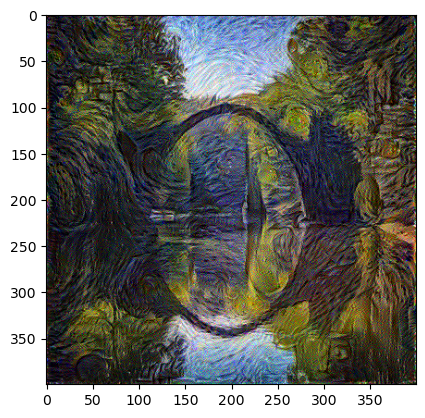

Epoch 2500 


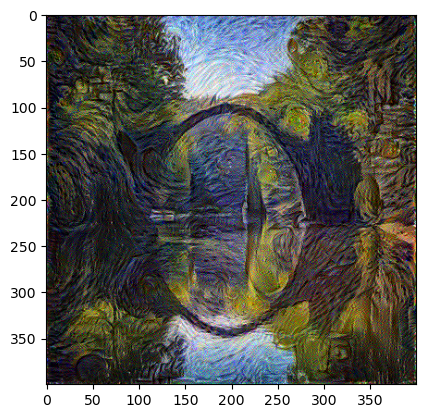

Epoch 2750 


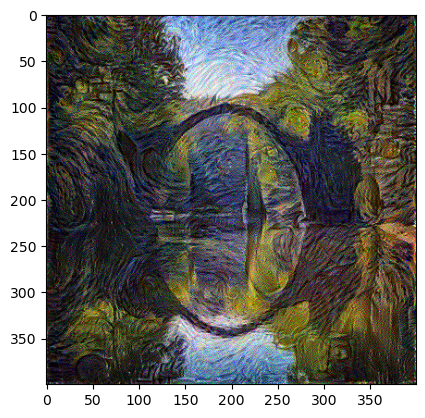

Epoch 3000 


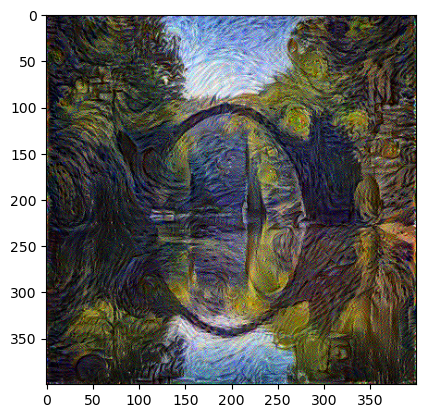

Epoch 3250 


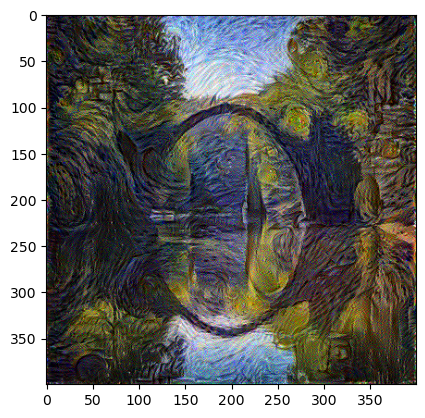

Epoch 3500 


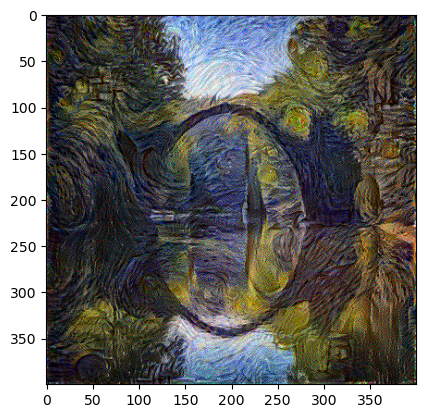

Epoch 3750 


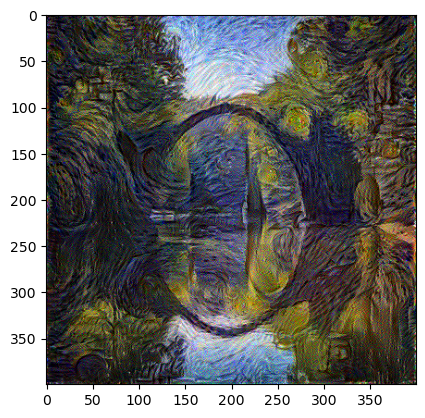

Epoch 4000 


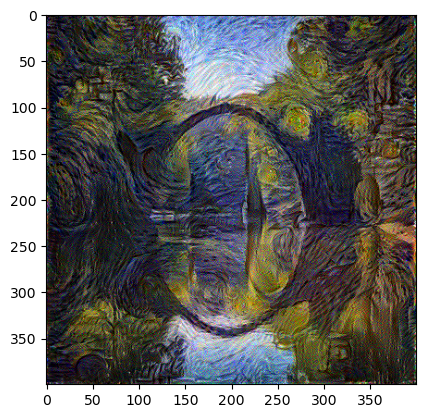

Epoch 4250 


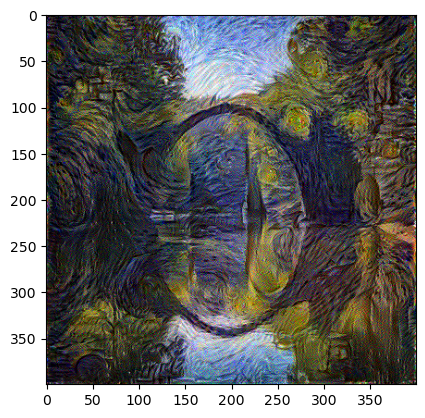

Epoch 4500 


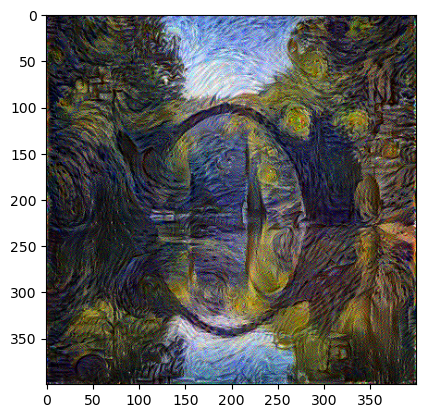

Epoch 4750 


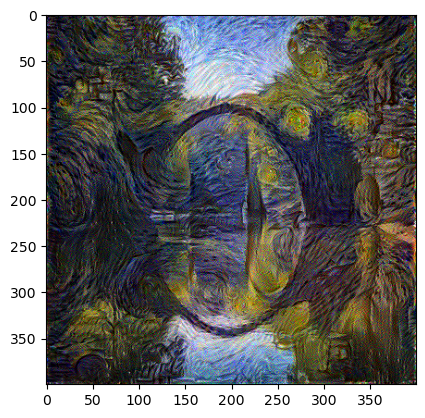

Epoch 5000 


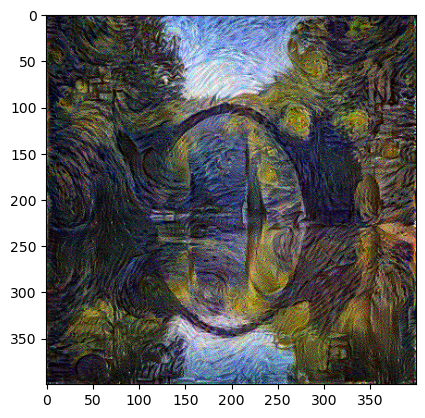

In [23]:
epochs = 5001
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"./img/output/image_{i}.jpg")
        plt.show() 

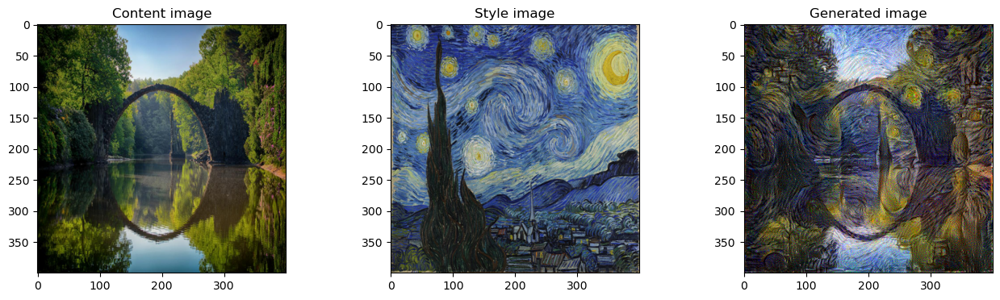

In [24]:
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

And Viola! It produce a nice looking image with the style of the artistic Starry night painting